In [ ]:
!apt-get install openjdk-8-jdk-headless -qq > /dev/null
!wget -q https://dlcdn.apache.org/spark/spark-3.2.1/spark-3.2.1-bin-hadoop3.2.tgz
!tar xf spark-3.2.1-bin-hadoop3.2.tgz
!pip install -q findspark
!pip install boto3
!pip install mysql.connector

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import boto3
import os
import logging
import pandas as pd
from botocore.exceptions import ClientError
import io
import mysql.connector
import sys
import mysql.connector as connection

In [ ]:
#load data in pandas dataframe
mydb = connection.connect(host="capstone-movies-jump-db.c2e7v9gghvc5.us-west-1.rds.amazonaws.com",user="admin", passwd='12345678', db = 'db')
query = "select * from Movies "
sql = 'select * from Movies'
film_sql = 'select * from film'
cast_sql = 'select * from cast'
df = pd.read_sql(sql = sql,  con = mydb)
film_df = pd.read_sql(sql= film_sql, con=mydb)
cast_df = pd.read_sql(sql=cast_sql, con=mydb)
mydb.close() 
df

,id,Series_Title,Released_Year,Certificate,Runtime,Rating,Overview,Meta_score,Director,Star1,Star2,Star3,Star4,Gross,Votes,Genre1,Genre2,Genre3
0,0,The Shawshank Redemption,1994,A,142,9.3,Two imprisoned men bond over a number of years...,80.0,Frank Darabont,Tim Robbins,Morgan Freeman,Bob Gunton,William Sadler,28341469.0,2343110,Drama,None,None
1,1,The Godfather,1972,A,175,9.2,An organized crime dynasty's aging patriarch t...,100.0,Francis Ford Coppola,Marlon Brando,Al Pacino,James Caan,Diane Keaton,134966411.0,1620367,Crime,Drama,None
2,2,The Dark Knight,2008,UA,152,9.0,When the menace known as the Joker wreaks havo...,84.0,Christopher Nolan,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,534858444.0,2303232,Action,Crime,Drama
3,3,The Godfather: Part II,1974,A,202,9.0,The early life and career of Vito Corleone in ...,90.0,Francis Ford Coppola,Al Pacino,Robert De Niro,Robert Duvall,Diane Keaton,57300000.0,1129952,Crime,Drama,None
4,4,12 Angry Men,1957,U,96,9.0,A jury holdout attempts to prevent a miscarria...,96.0,Sidney Lumet,Henry Fonda,Lee J. Cobb,Martin Balsam,John Fiedler,4360000.0,689845,Crime,Drama,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
994,8589935087,Breakfast at Tiffany's,1961,A,115,7.6,A young New York socialite becomes interested ...,76.0,Blake Edwards,Audrey Hepburn,George Peppard,Patricia Neal,Buddy Ebsen,NaN,166544,Comedy,Drama,Romance
995,8589935088,Giant,1956,G,201,7.6,Sprawling epic covering the life of a Texas ca...,84.0,George Stevens,Elizabeth Taylor,Rock Hudson,James Dean,Carroll Baker,NaN,34075,Drama,Western,None
996,8589935089,From Here to Eternity,1953,Passed,118,7.6,"In Hawaii in 1941, a private is cruelly punish...",85.0,Fred Zinnemann,Burt Lancaster,Montgomery Clift,Deborah Kerr,Donna Reed,30500000.0,43374,Drama,Romance,War
997,8589935090,Lifeboat,1944,NaN,97,7.6,Several survivors of a torpedoed merchant ship...,78.0,Alfred Hitchcock,Tallulah Bankhead,John Hodiak,Walter Slezak,William Bendix,NaN,26471,Drama,War,None


In [ ]:
film_df['Rating'] = film_df['Rating'].astype('float')

In [ ]:
df.corr()

,id,Released_Year,Runtime,Meta_score,Gross,Votes
id,1.000000,0.072445,-0.199646,-0.237531,-0.039085,-0.274286
Released_Year,0.072445,1.000000,0.165807,-0.339272,0.233250,0.241785
Runtime,-0.199646,0.165807,1.000000,-0.031399,0.139104,0.173304
Meta_score,-0.237531,-0.339272,-0.031399,1.000000,-0.030560,-0.018519
Gross,-0.039085,0.233250,0.139104,-0.030560,1.000000,0.574877
Votes,-0.274286,0.241785,0.173304,-0.018519,0.574877,1.000000


In [ ]:
import os
import numpy as np
import pandas as pd
import pandas_profiling
import seaborn as sns
import matplotlib.pyplot as plt
from pandas.plotting import parallel_coordinates

In [ ]:
from pandas.io.formats.format import DataFrameFormatter
!pip install -U pandas-profiling
!pip install MarkupSafe==2.0.1
#get the latest version of pandas_profiling
import numpy as np
import pandas as pd
import pandas_profiling

df = pd.DataFrame(df)
profile = df.profile_report()
profile

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached MarkupSafe-2.0.1-cp37-cp37m-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_12_x86_64.manylinux2010_x86_64.whl (31 kB)
  Attempting uninstall: MarkupSafe
    Found existing installation: MarkupSafe 2.1.1
    Uninstalling MarkupSafe-2.1.1:
      Successfully uninstalled MarkupSafe-2.1.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pandas-profiling 3.2.0 requires markupsafe~=2.1.1, but you have markupsafe 2.0.1 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

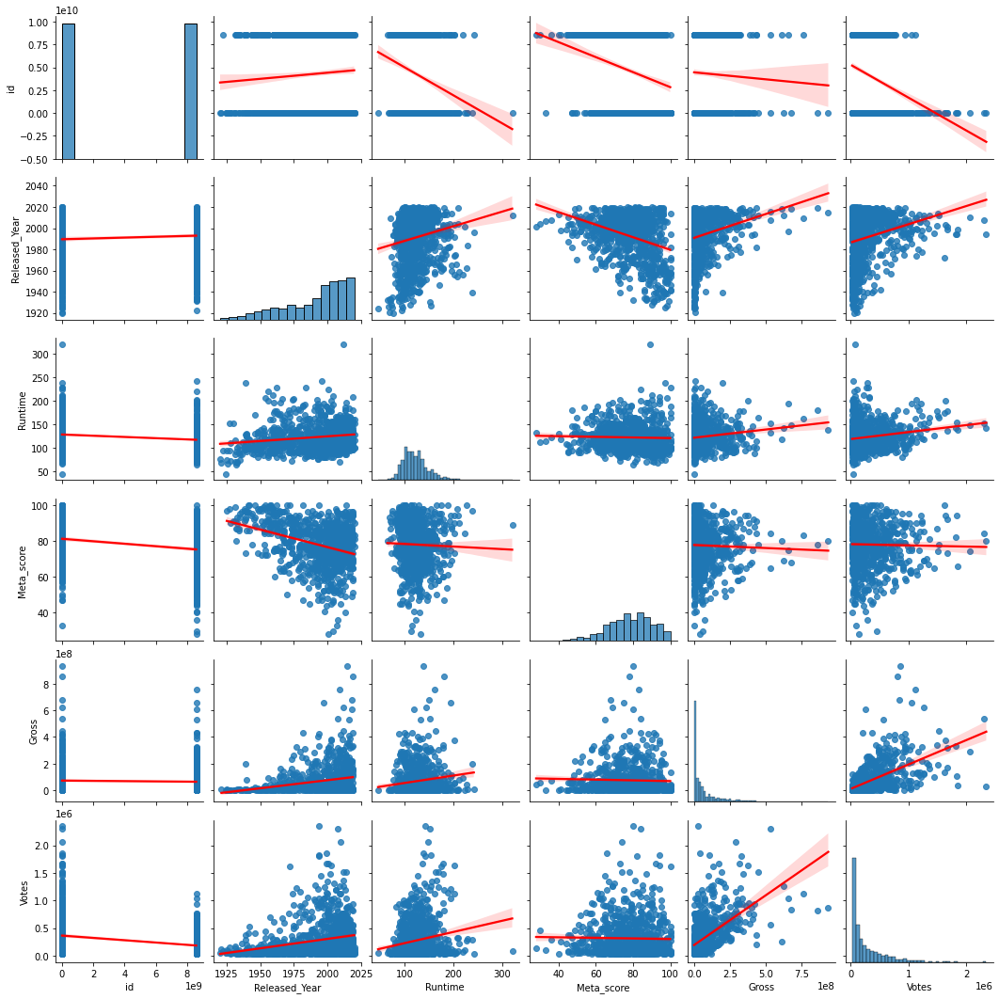

In [ ]:
sns.pairplot(df, kind="reg", palette="Set2", plot_kws={'line_kws':{'color':'red'}})
plt.show()

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 9 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 9 missing from current font.
  font.set_text(s, 0, flags=flags)


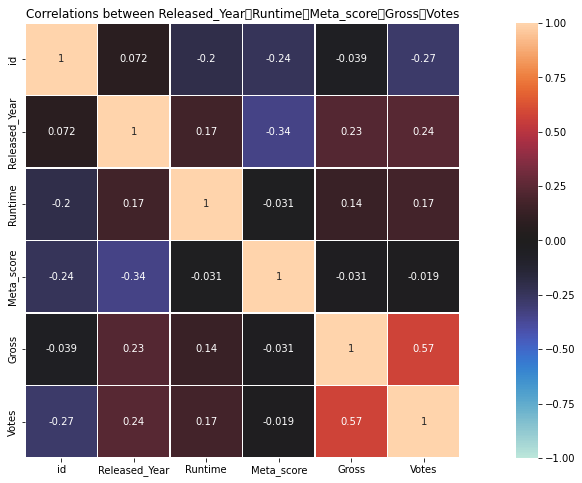

In [ ]:
plt.figure(figsize=(20,8))
heat_map = sns.heatmap(df.corr(), vmax=1, vmin=-1, center=0,
			linewidth=.5,square=True, annot = True)
plt.title('Correlations between Released_Year	Runtime	Meta_score	Gross	Votes')
plt.show()

In [ ]:
yearly_avg = film_df.dropna()
yearly_avg = yearly_avg.groupby(['Released_Year']).mean()
yearly_avg

,id,Runtime,Rating,Meta_score,Gross,Votes
Released_Year,,,,,,
1925,4.620000e+02,75.000000,8.000000,97.000000,5.097000e+04,53054.000000
1931,5.200000e+01,87.000000,8.500000,99.000000,1.918100e+04,167839.000000
1933,8.589935e+09,100.000000,7.900000,90.000000,1.000000e+07,78991.000000
1935,8.589935e+09,75.000000,7.800000,95.000000,4.360000e+06,43542.000000
1936,5.100000e+01,87.000000,8.500000,96.000000,1.632450e+05,217881.000000
...,...,...,...,...,...,...
2015,4.908534e+09,129.571429,7.857143,79.428571,1.653015e+08,435948.857143
2016,3.681401e+09,118.428571,7.914286,78.428571,1.694018e+08,342847.428571
2017,5.286114e+09,119.076923,7.861538,79.076923,1.430000e+08,380597.923077


In [ ]:
avg_runtime = yearly_avg['Runtime'].mean()
avg_rating = yearly_avg['Rating'].mean()
avg_metascore = yearly_avg['Meta_score'].mean()
avg_gross = yearly_avg['Gross'].mean()
avg_votes = yearly_avg['Votes'].mean()
min_year = yearly_avg.index.min()
max_year = yearly_avg.index.max()

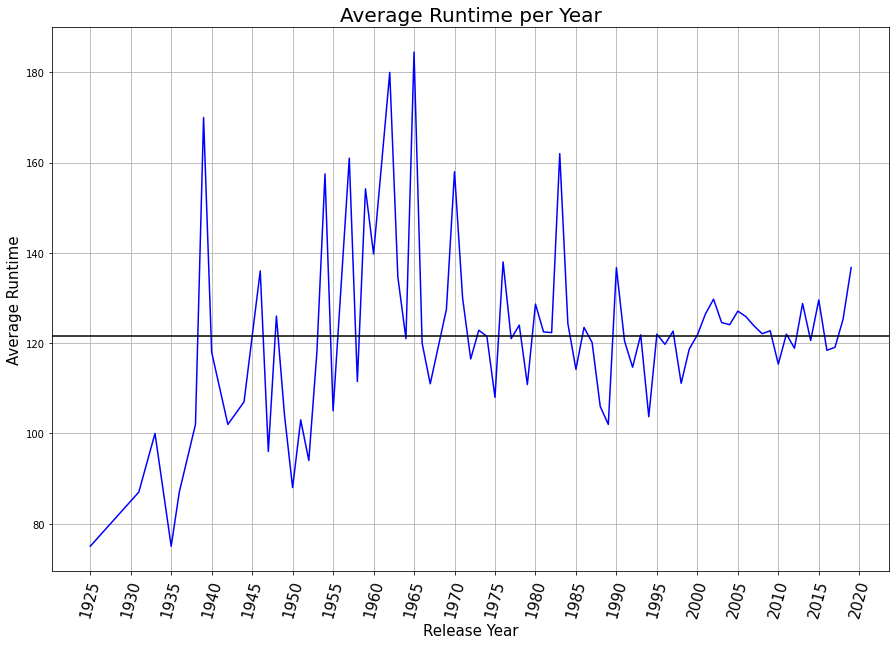

In [ ]:
plt.figure(figsize=(15, 10))
plt.plot(yearly_avg.index, yearly_avg['Runtime'], color='blue', label='Average Runtime')

plt.xlabel('Release Year', fontsize= 15)
plt.ylabel('Average Runtime', fontsize= 15)
plt.xticks(np.arange(min_year, max_year+2, step=5), fontsize = 15, rotation = 75)

plt.title('Average Runtime per Year', fontsize= 20)

plt.axhline(y=avg_runtime, color="black")

plt.grid()
plt.show()

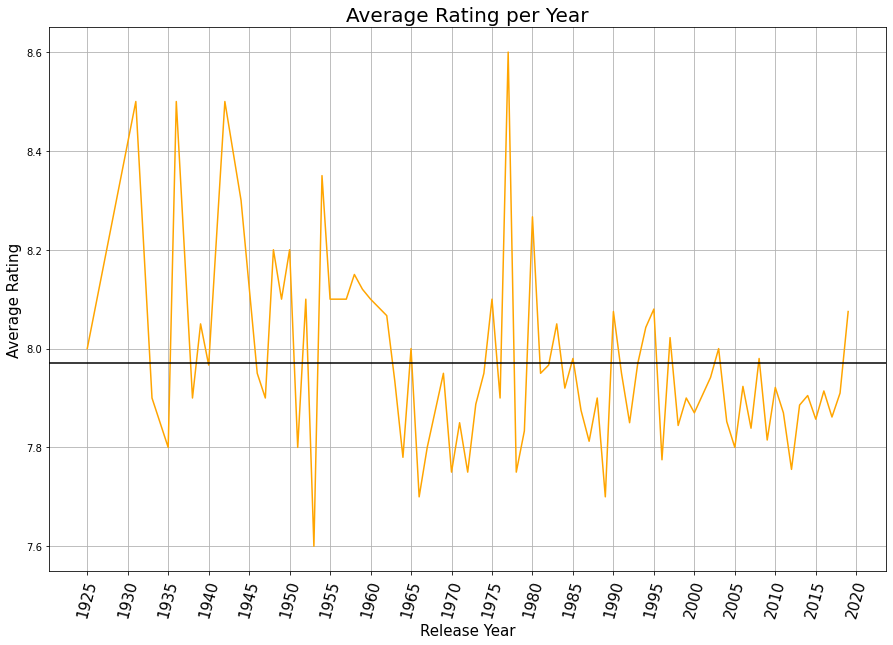

In [ ]:
plt.figure(figsize=(15, 10))
plt.plot(yearly_avg.index, yearly_avg['Rating'], color='orange', label='Average Rating')

plt.xlabel('Release Year', fontsize= 15)
plt.ylabel('Average Rating', fontsize= 15)
plt.xticks(np.arange(min_year, max_year+2, step=5), fontsize = 15, rotation = 75)

plt.title('Average Rating per Year', fontsize= 20)

plt.axhline(y=avg_rating, color="black")

plt.grid()
plt.show()

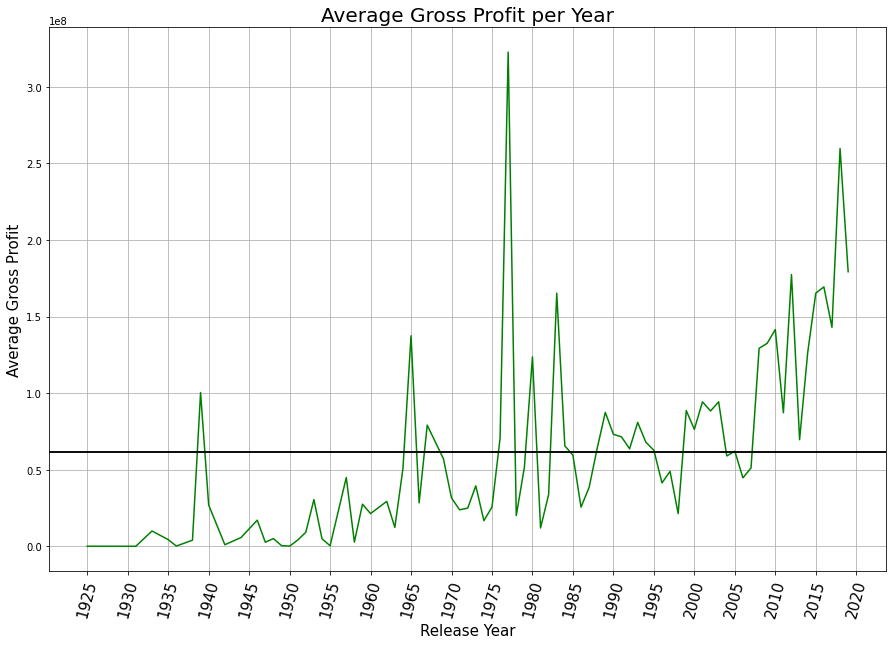

In [ ]:
plt.figure(figsize=(15, 10))

plt.plot(yearly_avg.index, yearly_avg['Gross'], color='green', label='Average Gross Profit')

plt.axhline(y=avg_gross, color="black")

plt.xlabel('Release Year', fontsize= 15)
plt.ylabel('Average Gross Profit', fontsize= 15)
plt.xticks(np.arange(min_year, max_year+2, step=5), fontsize = 15, rotation = 75)

plt.title('Average Gross Profit per Year', fontsize= 20)

plt.axhline(y=avg_gross, color="black")

plt.grid()
plt.show()

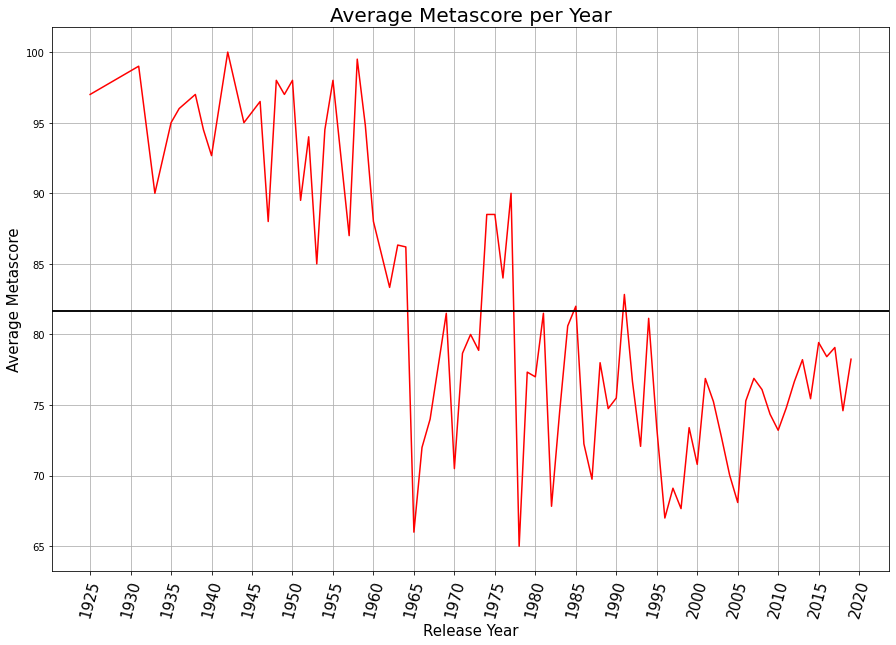

In [ ]:
plt.figure(figsize=(15, 10))
plt.plot(yearly_avg.index, yearly_avg['Meta_score'], color='red', label='Average Metascore')

plt.axhline(y=avg_metascore, color="black")

plt.xlabel('Release Year', fontsize= 15)
plt.ylabel('Average Metascore', fontsize= 15)
plt.xticks(np.arange(min_year, max_year+2, step=5), fontsize = 15, rotation = 75)

plt.title('Average Metascore per Year', fontsize= 20)

plt.axhline(y=avg_metascore, color="black")

plt.grid()
plt.show()

In [ ]:
plt.figure(figsize=(15, 10))
plt.plot(yearly_avg.index, yearly_avg['Votes'], color='purple', label='Average Votes')

plt.axhline(y=avg_votes, color="black")

plt.xlabel('Release Year', fontsize= 15)
plt.ylabel('Average Votes', fontsize= 15)
plt.xticks(np.arange(min_year, max_year+2, step=5), fontsize = 15, rotation = 75)

plt.title('Average Votes per Year', fontsize= 20)

plt.axhline(y=avg_votes, color="black")

plt.grid()
plt.show()

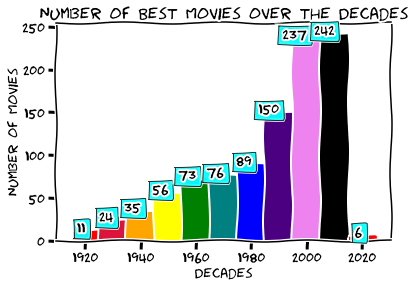

<Figure size 2160x1080 with 0 Axes>

In [ ]:
df1= df["id"].groupby((df["Released_Year"]//10)*10).count()
years = df1.index
counts = df1.values
def valuelabel(years,counts):
    for i in range(len(years)):
        plt.text(years[i],counts[i],counts[i], ha = 'right',
                 bbox = dict(facecolor = 'cyan', alpha =0.8))
with plt.xkcd():
  plt.title("Number of Best Movies over the Decades")
  plt.xlabel("Decades")
  plt.ylabel("Number of Movies")
  color=['red','crimson', 'orange', 'yellow', 'green','teal', 'blue', 'indigo', 'violet', 'black' ]
  valuelabel(years, counts)
  plt.bar(df1.index,df1.values,10 , color = color)
  plt.figure(figsize=(30,15))
  plt.show()